# Logistic Regression
The rain in Austrailia dataset contains about 10 years  of daily weather observations from numerous australian waether statons, the task is to create a fully-automated system that can cause today's weather data for a given location to predict whether it will rain at the location tomorrow

## Downloading th data

In [5]:
!pip install opendatasets --upgrade --quiet --no-warn-script-location

In [6]:
import opendatasets as od

In [7]:
od.version()

'0.1.22'

In [8]:
dataset_url = 'https://www.kaggle.com/jsphyg/weather-dataset-rattle-package'

In [9]:
od.download(dataset_url) #force=True download agaain

Skipping, found downloaded files in ".\weather-dataset-rattle-package" (use force=True to force download)


In [10]:
import os

In [11]:
data_dir = './weather-dataset-rattle-package'

In [12]:
os.listdir(data_dir)

['weatherAUS.csv']

In [13]:
train_csv = data_dir + '/weatherAUS.csv'

In [14]:
train_csv

'./weather-dataset-rattle-package/weatherAUS.csv'

In [15]:
import pandas as pd

In [17]:
raw_df = pd.read_csv(train_csv)

In [19]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [20]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

Except for date and location there are missing values in all the column, also to notice there is around 3k values missing in target column and rain today column hence those rows will be dropped to make a better prediction


In [23]:
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace = True)

In [25]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null   fl

# Exploratory Data Analysis and Visualization

In [26]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [28]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10,6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

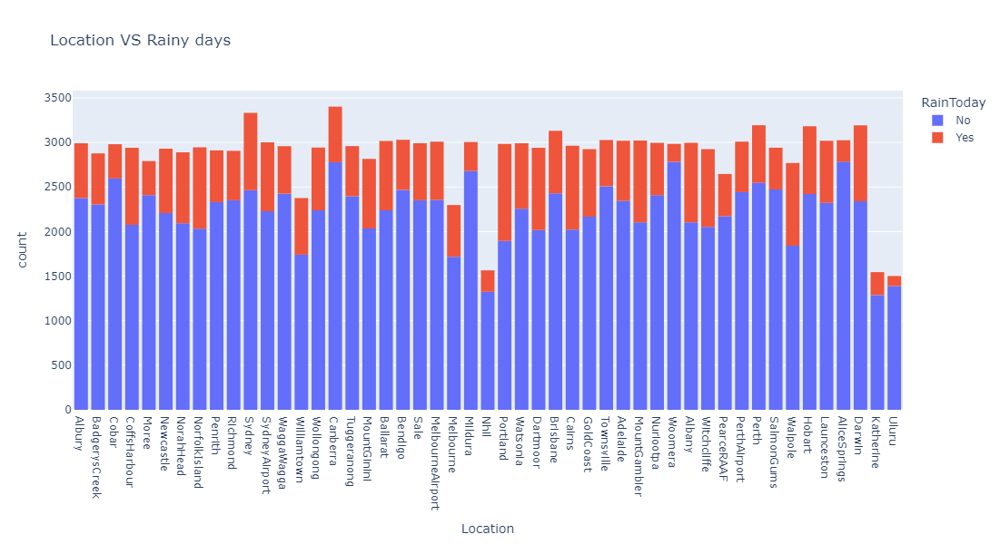

In [30]:
px.histogram(raw_df, x='Location', title='Location VS Rainy days', color="RainToday", height=600)

In [31]:
raw_df.Location.nunique()

49

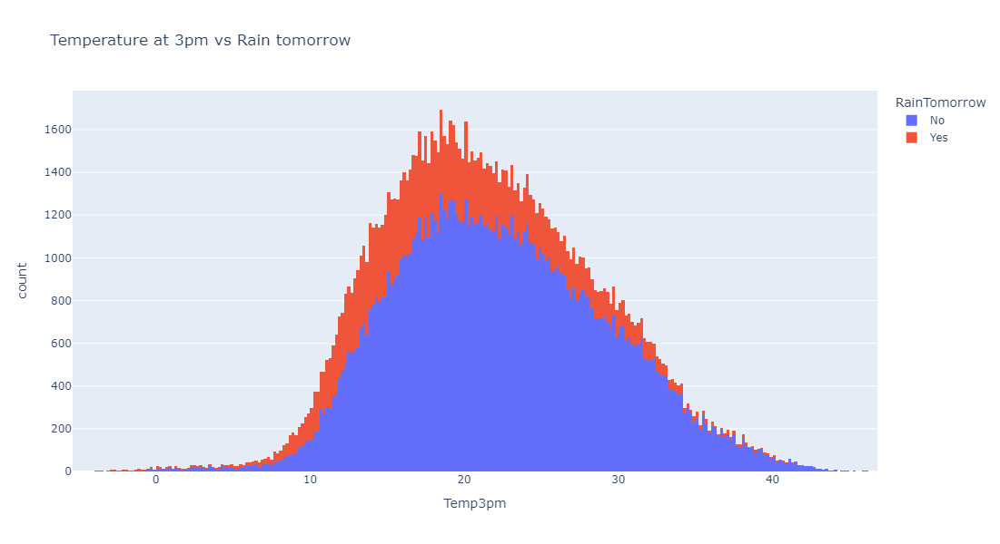

In [35]:
px.histogram(raw_df,
            x='Temp3pm',
            title="Temperature at 3pm vs Rain tomorrow",
             height=600,
            color = 'RainTomorrow')

The curve reptesents a Guassian curve or a normal distribution, there are more cases oflow twmperature rain tomorrow than high temerature and rain tomorrow

# Rain Today vs Rain Tomorrow

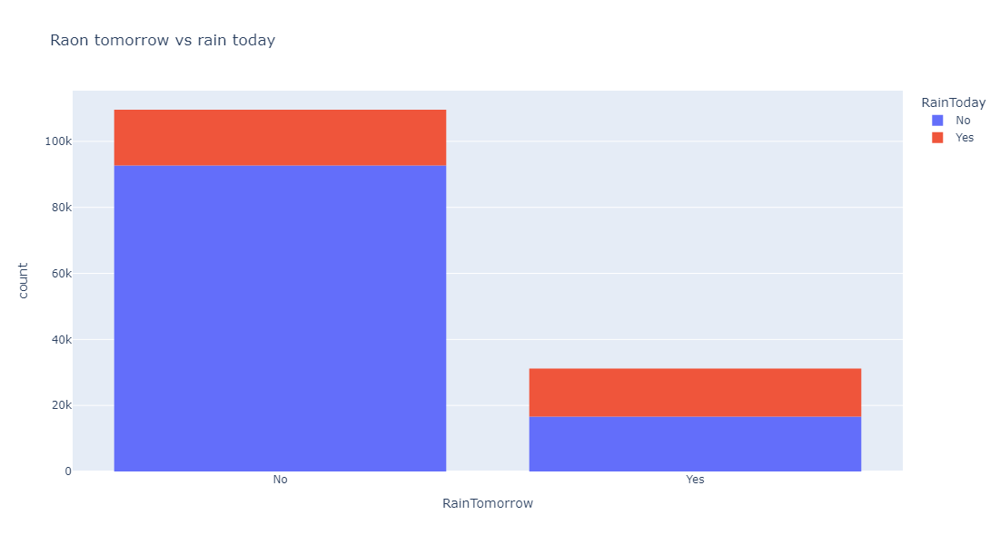

In [36]:
px.histogram(raw_df,
            x = 'RainTomorrow',
            color = 'RainToday',
            height=600,
            title='Raon tomorrow vs rain today')

for about 110k datapoints it did not rain and for the rest it did rain, This is called class inmbalance that is we do not have a equal observation at each class
predicting rain tomorrow is yes is difficult if rain today is no where as predicting rain tomorrow is no is easy when rain today is no